# Guidelines

# Imports

In [1]:
%reload_ext autoreload
%autoreload 2

import os
import math
import warnings
import missingno as msno
import numpy as np
import pandas as pd
import seaborn as sns
import folium
import datetime
from matplotlib import pyplot as plt
from pandas_profiling import ProfileReport
from datetime import datetime
from time import time
from folium import IFrame
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode
from folium.plugins import HeatMap
from sklearn.cluster import KMeans, DBSCAN, Birch
from sklearn.mixture import GaussianMixture
from sklearn.compose import ColumnTransformer, TransformedTargetRegressor
from sklearn.pipeline import Pipeline, make_pipeline 
from sklearn.metrics.cluster import adjusted_rand_score, rand_score
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn import preprocessing, decomposition, metrics
from hyperopt import hp, fmin, tpe, hp, anneal, Trials, STATUS_OK
from sklearn import metrics


from utils import *

pd.options.mode.chained_assignment = None  # default='warn'

%matplotlib inline

pd.set_option("display.max_columns", None)
pd.set_option('display.max_colwidth', None)

warnings.filterwarnings('ignore')

# Setting theme
sns.set_theme(style="white")

#
init_notebook_mode(connected = True)

#
#%reload_ext pycodestyle_magic
#%flake8_on
#%flake8_off

# Download 

In [2]:
# Import .csv files and convert into a pandas dataframe
df_rfm = pd.read_csv("df_rfm.csv", sep=",",
                         encoding="utf-8", low_memory=False)

df_general = pd.read_csv("df_general.csv", sep=",",
                         encoding="utf-8", low_memory=False)

# Set index
df_rfm = df_rfm.set_index('customer_unique_id')
df_general = df_general.set_index('customer_unique_id')

# Data Visualization

## df_rfm

In [3]:
info(df_rfm)
df_rfm.head()

3 columns
91233 rows
Rate of missing values in df : 0.0 %


,mean_monetary_value_rfm,count_frequency_rfm,last_recency_rfm
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,141.90,1,1340
0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,1,1343
0000f46a3911fa3c0805444483337064,86.22,1,1765
0000f6ccb0745a6a4b88665a16c9f078,43.62,1,1550
0004aac84e0df4da2b147fca70cf8255,196.89,1,1517


In [4]:
df_rfm.info()

<class 'pandas.core.frame.DataFrame'>
Index: 91233 entries, 0000366f3b9a7992bf8c76cfdf3221e2 to ffffd2657e2aad2907e67c3e9daecbeb
Data columns (total 3 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean_monetary_value_rfm  91233 non-null  float64
 1   count_frequency_rfm      91233 non-null  int64  
 2   last_recency_rfm         91233 non-null  int64  
dtypes: float64(1), int64(2)
memory usage: 2.8+ MB


In [5]:
df_rfm.describe()

,mean_monetary_value_rfm,count_frequency_rfm,last_recency_rfm
count,91233.000000,91233.000000,91233.000000
mean,157.716253,1.237633,1465.504708
std,215.752265,0.844651,152.609019
min,1.856818,1.000000,1229.000000
25%,60.750000,1.000000,1342.000000
50%,103.500000,1.000000,1446.000000
75%,174.970000,1.000000,1574.000000
max,13664.080000,75.000000,1924.000000


<AxesSubplot:>

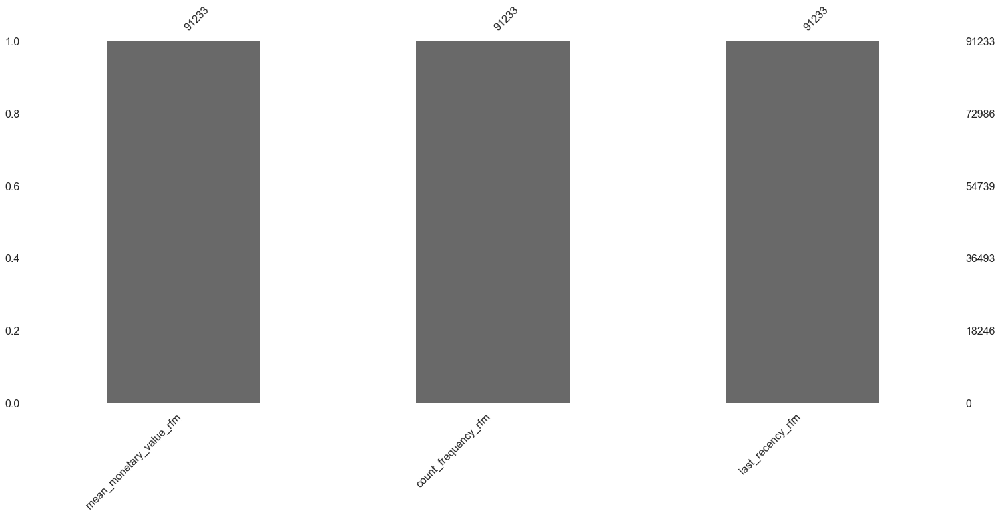

In [6]:
msno.bar(df_rfm)

In [7]:
max_elapsed_time = df_rfm.last_recency_rfm.max()
min_elapsed_time = df_rfm.last_recency_rfm.min()
elapsed_time = max_elapsed_time - min_elapsed_time

print("max_elapsed_time: " + str(max_elapsed_time) + " days")
print("min_elapsed_time: " + str(min_elapsed_time) + " days")
print("elapsed_time: " + str(elapsed_time) + " days")
print("")

print("days: " + str(elapsed_time))
print("weeks: " + str(elapsed_time/7))
print("months: " + str(elapsed_time/30))
print("years: " + str(elapsed_time/365))


max_elapsed_time: 1924 days
min_elapsed_time: 1229 days
elapsed_time: 695 days

days: 695
weeks: 99.28571428571429
months: 23.166666666666668
years: 1.904109589041096


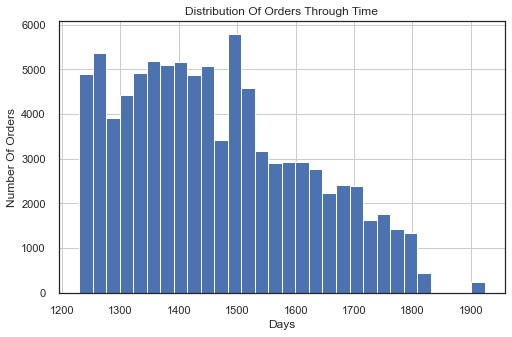

In [8]:
#
plt.figure(figsize=(8, 5))

df_rfm.last_recency_rfm.hist(bins=30)
plt.title("Distribution Of Orders Through Time")
plt.xlabel("Days")
plt.ylabel("Number Of Orders")

plt.show()


## df_general

In [9]:
info(df_general)
df_general.head()


20 columns
112913 rows
Rate of missing values in df : 0.0 %


,Unnamed: 0,order_id,product_id,freight_value,payment_type,payment_value,order_status,order_purchase_timestamp,review_score,seller_zip_code_prefix,seller_city,zip_code_prefix,customer_city,customer_state,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,product_category_name_english,time_elapsed_since_order
customer_unique_id,,,,,,,,,,,,,,,,,,,,
b701bebbdf478f5500348f03aff62121,109921,03ef5dedbe7492bdae72eec50764c43f,c7f27c5bef2338541c772b5776403e6a,8.33,credit_card,33.23,delivered,2018-08-29 14:52:00,3,1320,sao paulo,9541,sao caetano do sul,SP,-23.621055,-46.565101,sao caetano do sul,SP,party_supplies,1227
24ac2b4327e25baf39f2119e4228976a,61660,35a972d7f8436f405b56e36add1a7140,d04857e7b4b708ee8b8b9921163edba3,8.76,credit_card,93.75,delivered,2018-08-29 15:00:37,5,4102,sao paulo,13483,limeira,SP,-22.568350,-47.447439,limeira,SP,computers_accessories,1227
7febafa06d9d8f232a900a2937f04338,26885,168626408cb32af0ffaf76711caae1dc,bdcf6a834e8faa30dac3886c7a58e92e,15.39,voucher,61.29,delivered,2018-08-29 14:18:28,5,30111,belo horizonte,38600,paracatu,MG,-17.211338,-46.886436,paracatu,MG,health_beauty,1227
5c58de6fb80e93396e2f35642666b693,113565,0b223d92c27432930dfe407c6aea3041,2b4472df15512a2825ae86fd9ae79335,46.48,credit_card,510.96,delivered,2018-08-29 14:18:23,5,82400,curitiba,80045,curitiba,PR,-25.425530,-49.254480,curitiba,PR,kitchen_dining_laundry_garden_furniture,1227
5c58de6fb80e93396e2f35642666b693,113566,0b223d92c27432930dfe407c6aea3041,2b4472df15512a2825ae86fd9ae79335,46.48,credit_card,510.96,delivered,2018-08-29 14:18:23,5,82400,curitiba,80045,curitiba,PR,-25.425530,-49.254480,curitiba,PR,kitchen_dining_laundry_garden_furniture,1227


In [10]:
#
print(type(df_general.order_purchase_timestamp[0]))

#
df_general.order_purchase_timestamp = pd.to_datetime(df_general.order_purchase_timestamp)
print(type(df_general.order_purchase_timestamp[0]))

#
df_general['time_elapsed_since_order'] = (datetime.now() - df_general.order_purchase_timestamp).dt.days # utiliser seaborn !
df_general = df_general.sort_values("time_elapsed_since_order", ascending=True)
#
df_general.head()

<class 'str'>
<class 'pandas._libs.tslibs.timestamps.Timestamp'>


,Unnamed: 0,order_id,product_id,freight_value,payment_type,payment_value,order_status,order_purchase_timestamp,review_score,seller_zip_code_prefix,seller_city,zip_code_prefix,customer_city,customer_state,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,product_category_name_english,time_elapsed_since_order
customer_unique_id,,,,,,,,,,,,,,,,,,,,
b701bebbdf478f5500348f03aff62121,109921,03ef5dedbe7492bdae72eec50764c43f,c7f27c5bef2338541c772b5776403e6a,8.33,credit_card,33.23,delivered,2018-08-29 14:52:00,3,1320,sao paulo,9541,sao caetano do sul,SP,-23.621055,-46.565101,sao caetano do sul,SP,party_supplies,1229
9dfcc502727549f99c9f73dbd28b35e9,113230,e7c290bfc31d7eed478c3d3d2d4d2953,44406b87e5ac6494cdb0c9dccd3b88d3,9.03,credit_card,98.04,delivered,2018-08-28 22:30:32,2,5424,sao paulo,3059,sao paulo,SP,-23.542799,-46.595165,sao paulo,SP,costruction_tools_garden,1229
9dfcc502727549f99c9f73dbd28b35e9,113231,e7c290bfc31d7eed478c3d3d2d4d2953,44406b87e5ac6494cdb0c9dccd3b88d3,9.03,credit_card,98.04,delivered,2018-08-28 22:30:32,2,5424,sao paulo,3059,sao paulo,SP,-23.542799,-46.595165,sao paulo,SP,costruction_tools_garden,1229
7a22d14aa3c3599238509ddca4b93b01,85721,52018484704db3661b98ce838612b507,777798445efd625458a90c13f3b3e6e7,9.20,credit_card,73.10,delivered,2018-08-29 12:25:59,1,5125,sao paulo,5863,sao paulo,SP,-23.676046,-46.765741,sao paulo,SP,toys,1229
f80013faf776e37bcea7634d59c2181e,31225,c84d88553f9878bf2c7ecda2eb211ece,24bc2932a12c983f8e76d828b65cf39b,9.21,credit_card,74.21,delivered,2018-08-29 08:25:34,5,3679,sao paulo,4716,sao paulo,SP,-23.635391,-46.696836,são paulo,SP,health_beauty,1229


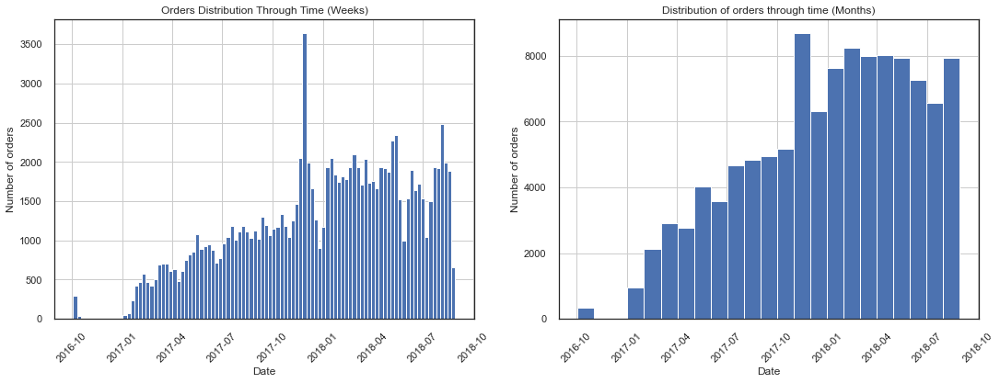

In [11]:
fig, axes =plt.subplots(1,2,figsize=(18,6))

df_general.order_purchase_timestamp.hist(bins=100, xrot=45, ax=axes[0])                                                                           
axes[0].set_title("Orders Distribution Through Time (Weeks)")
axes[0].set_xlabel("Date")
axes[0].set_ylabel("Number of orders")

df_general.order_purchase_timestamp.hist(bins=23, xrot=45, ax=axes[1])
axes[1].set_title("Distribution of orders through time (Months)")
axes[1].set_xlabel("Date")
axes[1].set_ylabel("Number of orders")

plt.show()

# Simulation

In [13]:
plot_3d_function(df_rfm, 
                 "",
                 1,
                 'count_frequency_rfm', 
                 'sum_monetary_value_rfm', 
                 'last_recency_rfm')

In [14]:
df_rfm.describe()

,mean_monetary_value_rfm,count_frequency_rfm,last_recency_rfm
count,91233.000000,91233.000000,91233.000000
mean,157.716253,1.237633,1463.091458
std,215.752265,0.844651,152.609780
min,1.856818,1.000000,1226.000000
25%,60.750000,1.000000,1340.000000
50%,103.500000,1.000000,1444.000000
75%,174.970000,1.000000,1571.000000
max,13664.080000,75.000000,1921.000000


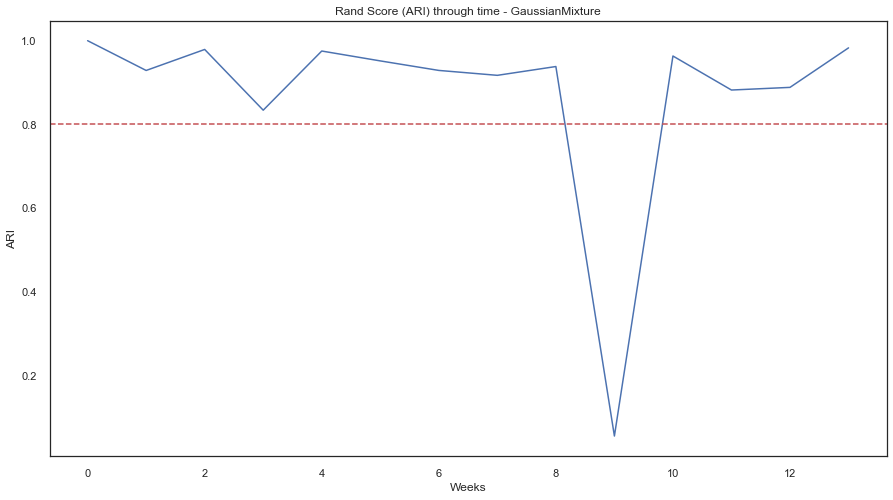

In [36]:
kmeans_best_params = {'algorithm': 'elkan',
                         'init': 'random',
                         'max_iter': 200,
                         'n_clusters': 3,
                         'n_init': 5,
                         'random_state': 1234}

gm_best_params = {'covariance_type': 'full',
                   'init_params': 'kmeans',
                   'max_iter': 100,
                   'n_components': 2,
                   'n_init': 1,
                   'random_state': 1234,
                   'reg_covar': 1e-06,
                   'tol': 0.001}

birch_best_params = {'branching_factor': 40,
                     'n_clusters': 3,
                     'threshold': 0.6}

#
df_rs_plot = simulation_function(df_rfm, GaussianMixture, gm_best_params, 7, 600)
# GaussianMixture, gm_best_params, 7, 660)

# Plot
fig, ax = plt.subplots(figsize=(15,8))

ax.plot(df_rs_plot)
plt.axhline(y=0.8, color='r', linestyle='--')
plt.title("Rand Score (ARI) through time - GaussianMixture")
plt.xlabel("Weeks")
plt.ylabel("ARI")
plt.show()
